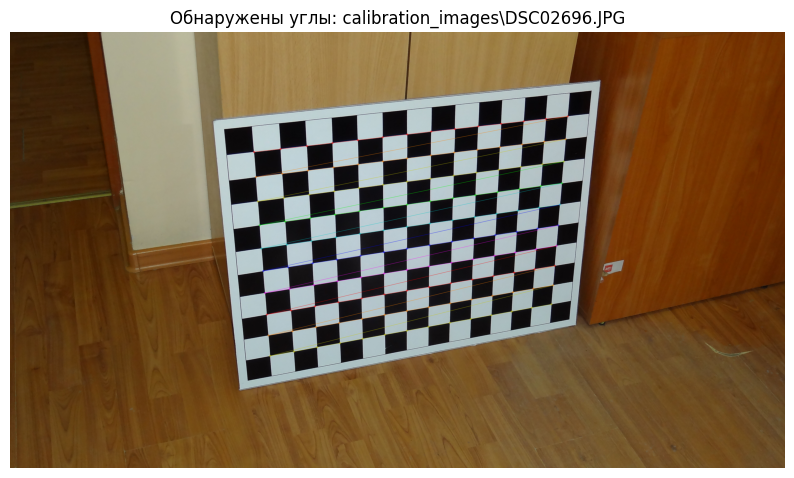

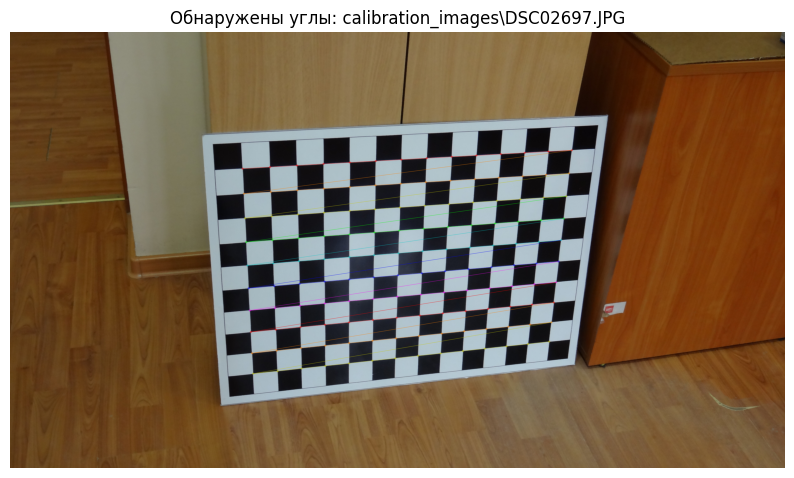

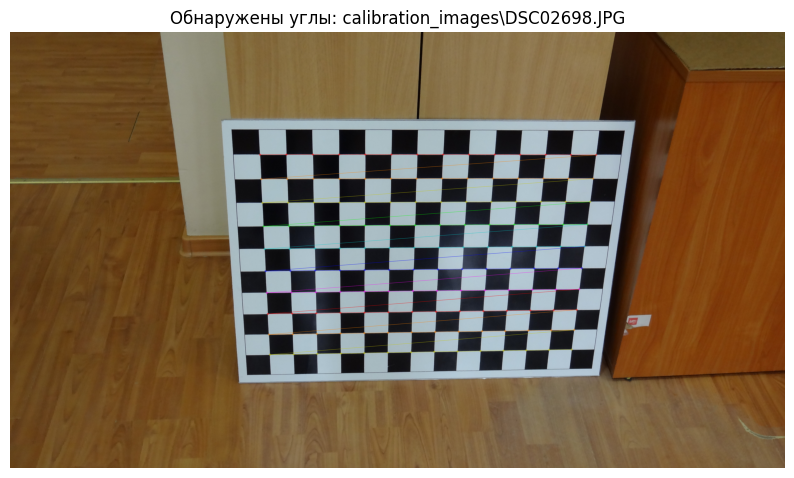

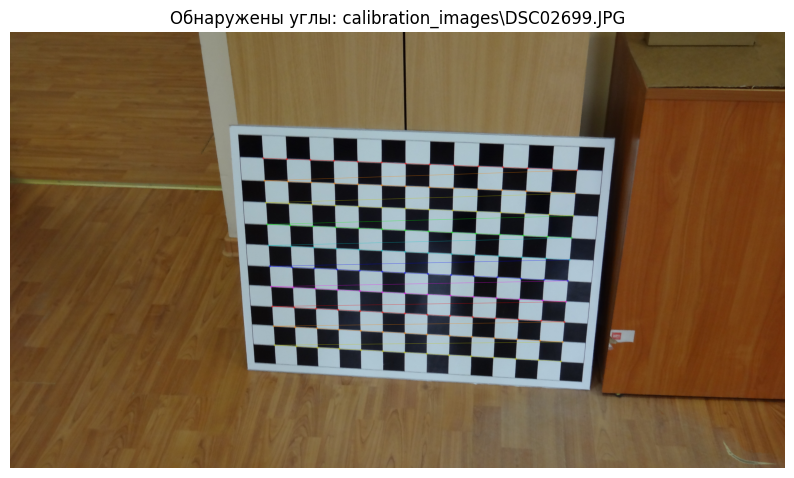

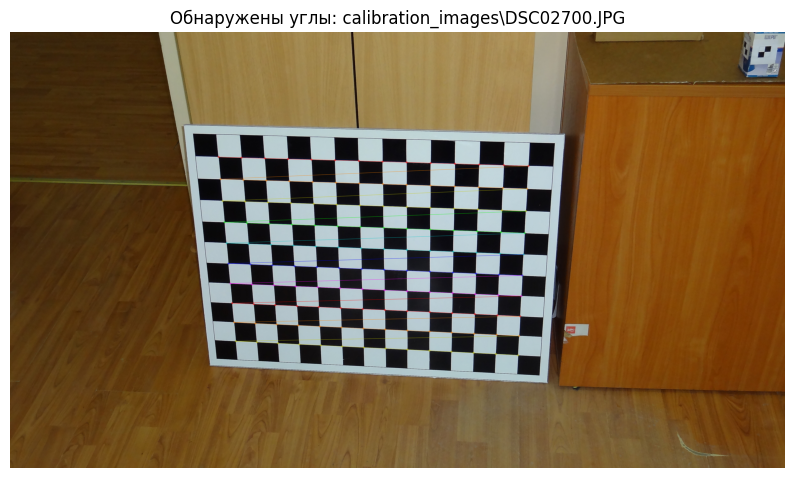

...

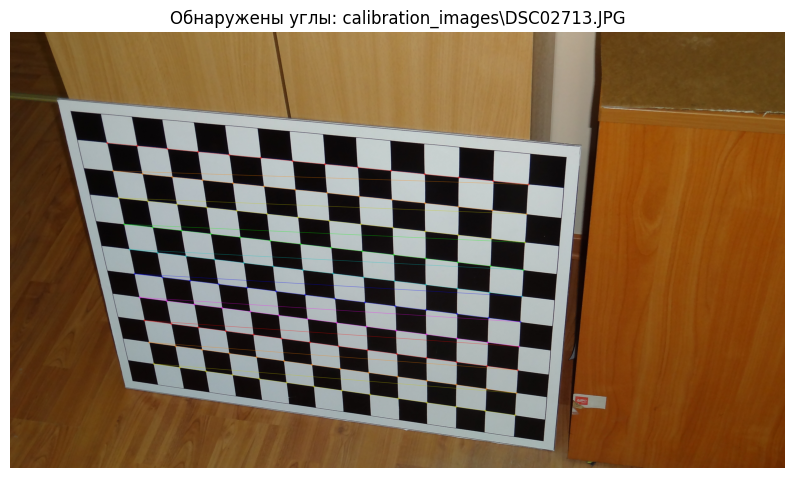

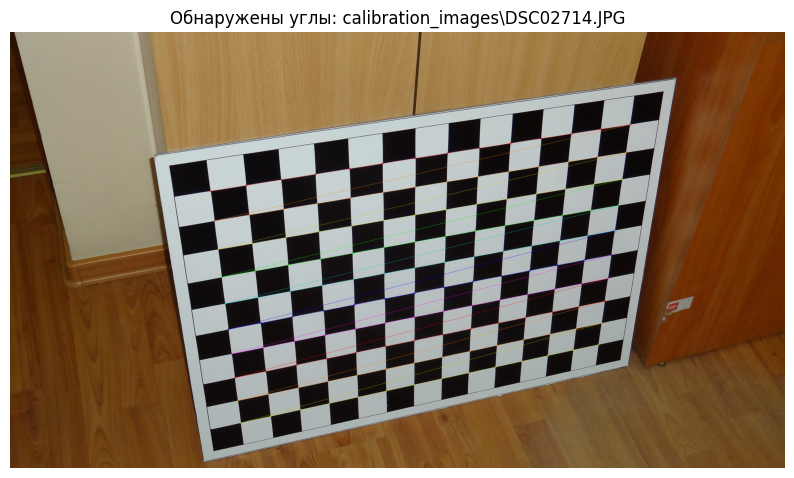

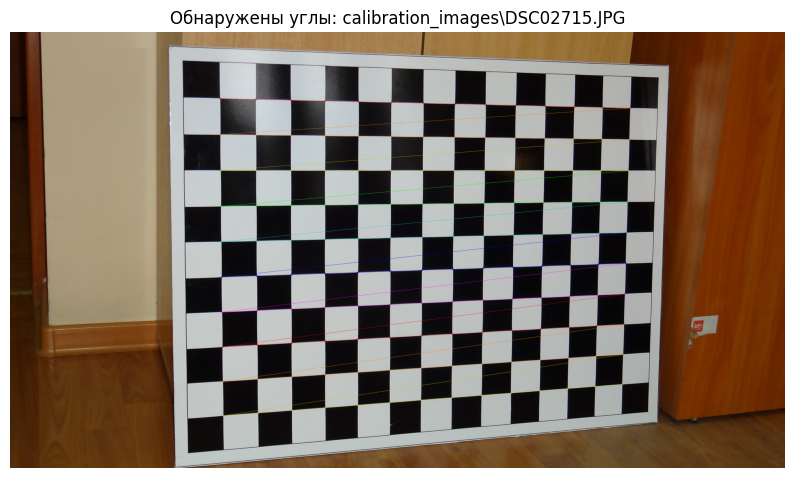

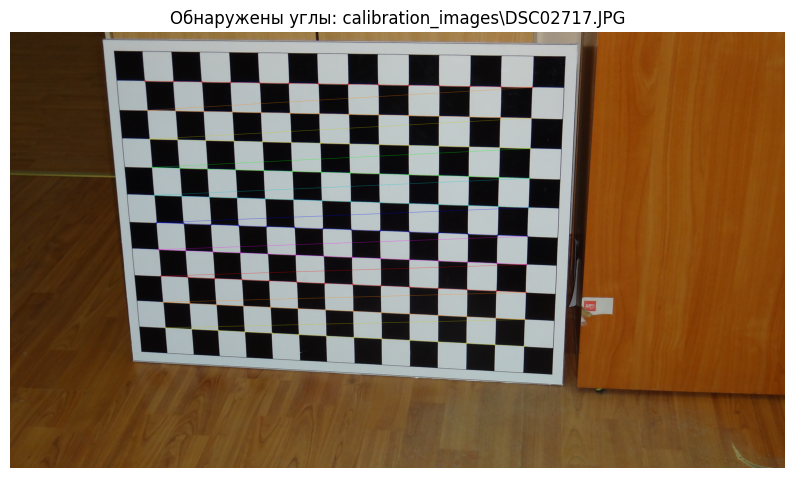

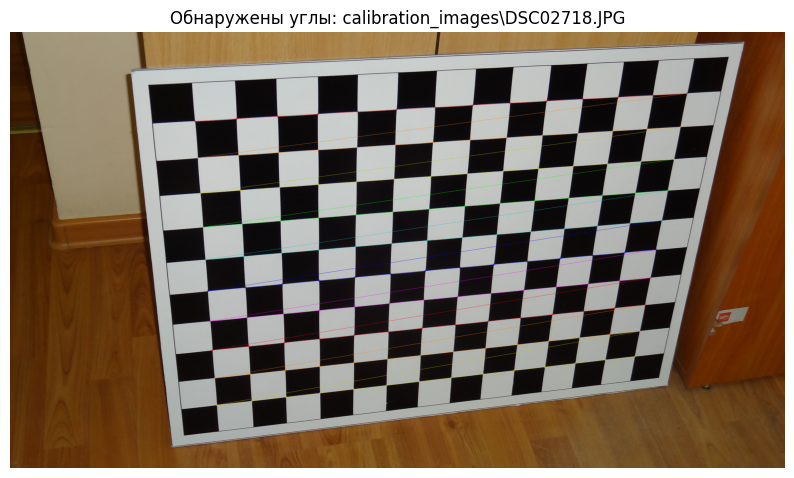

In [1]:
import numpy as np
import cv2
import glob
import os
import matplotlib.pyplot as plt

# termination criteria для cornerSubPix
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 30, 0.001)

# размер шахматной доски (внутренние углы!)
pattern_size = (14, 10)  # 14 по горизонтали, 10 по вертикали

# создаём шаблон 3D-точек для доски
objp = np.zeros((pattern_size[1] * pattern_size[0], 3), np.float32)
objp[:, :2] = np.mgrid[0:pattern_size[0], 0:pattern_size[1]].T.reshape(-1, 2)

# списки для хранения всех точек
objpoints = []  # 3D точки в реальном мире
imgpoints = []  # 2D точки на изображениях

# путь к изображениям
images = glob.glob("calibration_images/*.jpg")

for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Поиск углов
    ret, corners = cv2.findChessboardCorners(gray, pattern_size, None)

    if ret:
        objpoints.append(objp)

        # Уточнение координат
        corners2 = cv2.cornerSubPix(gray, corners, (11, 11), (-1, -1), criteria)
        imgpoints.append(corners2)

        # Рисуем найденные углы
        cv2.drawChessboardCorners(img, pattern_size, corners2, ret)

        # Показываем изображение с углами через matplotlib
        plt.figure(figsize=(10, 6))
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title(f"Обнаружены углы: {fname}")
        plt.axis('off')
        plt.show()


In [2]:
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1],None,None)

In [3]:
img = cv2.imread('calibration_images/DSC02696.JPG')
h, w = img.shape[:2]
newcameramtx, roi = cv2.getOptimalNewCameraMatrix(mtx, dist, (w,h), 1, (w,h))

In [4]:
# undistort
dst = cv2.undistort(img, mtx, dist, None, newcameramtx)
# crop the image
x,y,w,h = roi
dst = dst[y:y+h, x:x+w]
cv2.imwrite('calibresult.png',dst)

True

In [11]:
# undistort
mapx,mapy = cv2.initUndistortRectifyMap(mtx,dist,None,newcameramtx,(w,h),5)
dst = cv2.remap(img,mapx,mapy,cv2.INTER_LINEAR)
# crop the image
x,y,w,h = roi
dst = dst[y:y+h, x:x+w]
cv2.imwrite('calibresult_2.png',dst)

True

In [6]:
print("ROI:", roi)
print("dst shape BEFORE crop:", dst.shape)

ROI: (2918, 1377, 1727, 1353)
dst shape BEFORE crop: (0, 0, 3)


In [8]:
mean_error = 0

for i in range(len(objpoints)):
    imgpoints2, _ = cv2.projectPoints(objpoints[i], rvecs[i], tvecs[i], mtx, dist)
    error = cv2.norm(imgpoints[i], imgpoints2, cv2.NORM_L2) / len(imgpoints2)
    mean_error += error

print("Средняя ошибка репроекции:", mean_error / len(objpoints))


Средняя ошибка репроекции: 0.155099698070395


In [24]:
print("Внутренняя калибровка")
print("Матрица камеры:\n", mtx)
print("Коэффициенты дисторсии:\n", dist)

print("\nВнешняя калибровка")
for i in range(len(rvecs)):
    print(f"\nИзображение {i+1}")
    print("Вектор вращения (rvec):\n", rvecs[i].ravel())
    print("Вектор смещения (tvec):\n", tvecs[i].ravel())


Внутренняя калибровка
Матрица камеры:
 [[6.05304386e+03 0.00000000e+00 2.54106629e+03]
 [0.00000000e+00 6.03790771e+03 1.30293217e+03]
 [0.00000000e+00 0.00000000e+00 1.00000000e+00]]
Коэффициенты дисторсии:
 [[-1.75617496e-01  3.62500911e+00  3.27014250e-03  3.28190397e-03
  -2.11790265e+01]]

Внешняя калибровка

Изображение 1
Вектор вращения (rvec):
 [ 0.45590314 -0.33471187 -0.07278109]
Вектор смещения (tvec):
 [-5.86132576 -3.20648934 35.54370596]

Изображение 2
Вектор вращения (rvec):
 [ 0.45060017 -0.2504773  -0.0211829 ]
Вектор смещения (tvec):
 [-6.23182689 -2.56579195 35.19734912]

Изображение 3
Вектор вращения (rvec):
 [ 0.45231412 -0.08096209  0.01110823]
Вектор смещения (tvec):
 [-5.78440402 -3.18894743 36.38687134]

Изображение 4
Вектор вращения (rvec):
 [0.40956276 0.09488636 0.02728659]
Вектор смещения (tvec):
 [-6.24668357 -3.37393141 40.07647856]

Изображение 5
Вектор вращения (rvec):
 [0.42292284 0.09803041 0.01790061]
Вектор смещения (tvec):
 [-8.20364185 -3.45929383